In [1]:
import numpy as np
import geopandas as gpd
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, MaxAbsScaler
from sklearn.impute import KNNImputer

import sys
import xgboost as xgb
sys.path.insert(0, r"E:\Drive\NOA\MBD-Prediction\Modules")
pd.set_option('display.max_columns', None)
random.seed(0)
np.random.seed(0)
from utils import read_data, convert_multiple_cases, encode_cyclical, plot_imbalance, dataframe_describe, matplotlib_to_plotly, interactive_colored_mapbox

import warnings
warnings.filterwarnings("ignore")

In [2]:
NUTS0 = 'GR'
NUTS2 = 'Attica'
NUTS2_ID = 'EL30'
TEST_YEAR = '2024'
NUTS2_EL = 'αττικης'

In [3]:
base_folder = 'E:/Drive/NOA/MBD-Prediction/Grid Level/data'

train_file = f'{base_folder}/{NUTS0}_WNV_Dataset_GRID_OP_2010_2021.csv'
test_file = f'{base_folder}/{NUTS2}\{NUTS0}_{NUTS2}_WNV_Dataset_GRID_OP_{TEST_YEAR}.csv'

data_train = read_data(train_file)
data_test = read_data(test_file)

data_train.reset_index(drop = True, inplace = True)
data_test.reset_index(drop = True, inplace = True)

print(data_train.shape)
print(data_test.shape)

(664560, 92)
(5896, 91)


In [4]:
data_train.head()

,cell_code,nuts2_id,nuts3_id,lau1,year,month,x,y,ndvi,ndmi,ndwi,ndbi,ndvi_mean,ndmi_mean,ndwi_mean,ndbi_mean,ndvi_std,ndmi_std,ndwi_std,ndbi_std,lst_day_mean,lst_jan_day_mean,lst_feb_day_mean,lst_mar_day_mean,lst_apr_day_mean,lst_night_mean,lst_jan_night_mean,lst_feb_night_mean,lst_mar_night_mean,lst_apr_night_mean,lst_mean,lst_jan_mean,lst_feb_mean,lst_mar_mean,lst_apr_mean,monthly_lst_min,monthly_lst_max,rainfall_mean,acc_rainfall_1week,acc_rainfall_2week,acc_rainfall_month,acc_rainfall_jan,bio1,bio2,bio3,bio4,bio5,bio6,bio7,bio8,bio9,bio10,bio11,bio12,bio13,bio14,bio15,bio16,bio17,bio18,bio19,lc_prop1,lc_prop2,lc_prop3,lc_type1,lc_type2,lc_type3,lc_type4,lc_type5,distance_to_coast,distance_to_river,slope_mean_1km,aspect_mean_200m,elevation_mean_1km,hillshade_mean_1km,fs_area_1km,flow_accu_200m,males_lt15,males_15t64,males_gt65,males_total,females_lt15,females_15t64,females_gt65,females_total,mio_eur,l_total,unl_total,mount_type,urbn_type,coast_type,cases
0,AAE407,EL43,EL434,αποκορωνου,2010,1,24.117404,35.410691,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.105484,12.522258,13.950714,19.048065,22.682667,9.001613,9.339677,7.253571,9.301613,11.206,10.553548,10.930968,10.602143,14.174839,16.944333,3.110,20.630,10.158791,8.697677,20.032296,307.352892,449.754390,19.250000,18.666667,47.863248,773.275207,42.0,3.0,39.0,10.666667,29.000000,29.000000,10.500000,2145.0,407.0,4.0,80.863945,1070.0,15.0,15.0,943.0,22,20,20,9,9,4,1,1,6585.886993,178.967214,11,129.520913,259.412149,167.327918,0.000000,52.950027,12899.0,52814.0,11989.0,77702.0,12363.0,50340.0,14324.0,77027.0,2953.85,4278.0,4973.0,2,2,1,0
1,AAE468,EL43,EL433,μυλοποταμου,2010,1,24.789225,35.408170,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.274,18.134,8.900615,5.977331,8.328200,275.917567,363.227389,16.833333,20.500000,50.000000,796.107957,41.0,0.0,41.0,8.500000,27.333333,27.333333,7.833333,1746.0,328.0,0.0,81.286010,818.0,1.0,1.0,655.0,31,30,50,11,10,1,6,6,0.000000,4784.892552,13,63.847297,51.029019,188.997189,1.128647,6.233711,7596.0,27753.0,6190.0,41539.0,7371.0,28024.0,7574.0,42969.0,1457.56,2031.0,2221.0,3,3,1,0
2,AAF412,EL43,EL434,αποκορωνου,2010,1,24.172455,35.401609,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.062258,13.808065,15.227857,19.090645,22.681333,9.595161,9.121613,7.030714,8.535161,10.694,11.828710,11.464839,11.129286,13.812903,16.687667,5.970,20.070,10.158791,8.697677,20.032296,307.352892,449.754390,19.458333,20.583333,46.780303,795.000953,44.0,0.0,44.0,10.500000,29.500000,29.500000,10.166667,2145.0,407.0,4.0,80.863945,1070.0,15.0,15.0,943.0,31,30,30,10,10,1,6,6,5449.996872,871.966870,11,251.863885,182.026884,183.272934,0.000000,3.239146,12899.0,52814.0,11989.0,77702.0,12363.0,50340.0,14324.0,77027.0,2953.85,4278.0,4973.0,2,2,1,0
3,AAF418,EL43,EL434,αποκορωνου,2010,1,24.238531,35.401496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.268065,13.366774,14.356429,18.776452,21.927333,8.675161,8.922258,7.170000,8.628065,10.402,11.471613,11.144516,10.763214,13.702258,16.164667,5.470,19.870,9.615967,6.088871,14.048537,297.686708,442.198871,18.916667,18.833333,45.934959,773.373170,42.0,1.0,41.0,10.500000,28.666667,28.666667,10.166667,2022.0,366.0,2.0,79.439558,985.0,14.0,14.0,854.0,22,20,20,9,9,4,2,2,2072.028070,3644.010740,6,148.262387,301.797520,184.889754,0.000000,9.160420,12899.0,52814.0,11989.0,77702.0,12363.0,50340.0,14324.0,77027.0,2953.85,4278.0,4973.0,2,2,1,0
4,AAF461,EL43,EL433,μυλοποταμου,2010,1,24.712056,35.399633,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.909355,13.180968,15.556429,20.501613,24.858000,9.899032,8.513226,7.876429,9.155806,10.950,13.404194,10.847097,11.716429,14.828710,17.904000,6.510,21.790,8.895365,8.553344,15.224943,275.746825,414.026678,19.416667,20.833333,49.603175,783.591189,42.0,0.0,42.0,11.000000,29.166667,29.166667,9.833333,1825.0,345.0,0.0,81.455549,855.0,4.0,4.0,707.0,31,36,30,12,12,1,6,7,2719.492211,298.312749,10,176.489002,56.734191,180.2360

In [5]:
data_test.head()

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,ndvi,ndmi,ndwi,ndbi,ndvi_mean,ndmi_mean,ndwi_mean,ndbi_mean,ndvi_std,ndmi_std,ndwi_std,ndbi_std,lst_day_mean,lst_jan_day_mean,lst_feb_day_mean,lst_mar_day_mean,lst_apr_day_mean,lst_night_mean,lst_jan_night_mean,lst_feb_night_mean,lst_mar_night_mean,lst_apr_night_mean,lst_mean,lst_jan_mean,lst_feb_mean,lst_mar_mean,lst_apr_mean,monthly_lst_min,monthly_lst_max,rainfall_mean,acc_rainfall_1week,acc_rainfall_2week,acc_rainfall_month,acc_rainfall_jan,bio1,bio2,bio3,bio4,bio5,bio6,bio7,bio8,bio9,bio10,bio11,bio12,bio13,bio14,bio15,bio16,bio17,bio18,bio19,lc_prop1,lc_prop2,lc_prop3,lc_type1,lc_type2,lc_type3,lc_type4,lc_type5,distance_to_coast,distance_to_river,slope_mean_1km,aspect_mean_200m,elevation_mean_1km,hillshade_mean_1km,fs_area_1km,flow_accu_200m,males_lt15,males_15t64,males_gt65,males_total,females_lt15,females_15t64,females_gt65,females_total,mio_eur,l_total,unl_total,mount_type,urbn_type,coast_type
0,0,EL30,EL307,κυθηρων,2024,1,22.92536,36.22923,0.346057,0.128519,-0.281849,-0.128519,0.295103,0.162751,-0.201424,-0.162751,0.045012,0.035053,0.046129,0.035053,15.300968,12.490000,13.181034,16.062903,21.481333,10.699032,9.364194,9.434138,9.587419,12.883333,13.000000,10.927097,11.307586,12.825161,17.182333,2.63,17.93,4.942890,0.000000,22.466780,153.229601,151.378399,18.333333,17.500000,43.750000,740.188346,41.0,1.0,40.0,11.333333,24.666667,28.000000,9.500000,833.0,202.0,1.0,109.989323,465.0,9.0,9.0,310.0,22,20,20,9,9,4,2,2,1554.806149,2545.316809,27,217.502550,313.370524,207.335062,0.0,1.499166,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1
1,1,EL30,EL307,κυθηρων,2024,1,22.92536,36.31906,0.283297,0.246288,-0.166702,-0.246288,0.327375,0.216398,-0.246303,-0.216398,0.047167,0.035670,0.054303,0.035670,15.966774,13.588065,15.263793,17.157097,22.110667,11.275806,9.187419,9.833448,9.995161,12.966000,13.621290,11.387742,12.548621,13.576129,17.538333,7.35,19.27,5.729719,0.000000,21.155823,177.614639,139.327092,18.375000,17.416667,39.583333,755.622862,41.0,-3.0,44.0,13.000000,25.333333,28.166667,9.666667,754.0,177.0,0.0,110.115026,431.0,3.0,5.0,234.0,21,20,20,8,8,4,2,2,1765.480985,6926.111027,10,197.077012,274.126271,180.773995,0.0,5.117582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1
2,2,EL30,EL307,κυθηρων,2024,1,22.92536,36.33703,0.493300,0.260251,-0.371769,-0.260251,0.406894,0.286010,-0.303116,-0.286010,0.022098,0.051709,0.018465,0.051709,15.062258,13.320323,13.739655,16.131290,21.338000,11.680323,9.788710,10.166552,10.472581,13.859333,13.371290,11.554516,11.953103,13.301935,17.598667,8.13,17.35,5.729719,0.000000,21.155823,177.614639,139.327092,18.291667,14.916667,37.291667,713.652046,40.0,0.0,40.0,11.833333,24.333333,27.666667,10.333333,754.0,177.0,0.0,110.115026,431.0,3.0,5.0,304.0,11,10,10,1,1,7,1,1,1903.382813,7495.847864,7,235.289966,337.325945,186.904082,0.0,1.487290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1
3,3,EL30,EL307,κυθηρων,2024,1,22.94752,36.19329,0.340979,0.269226,-0.166650,-0.269226,0.301282,0.199342,-0.181689,-0.199342,0.038853,0.063990,0.053832,0.063990,14.664839,11.575806,13.784483,15.124194,22.332667,11.002258,9.050645,8.898966,8.758387,12.624000,12.833548,10.313226,11.341724,11.941290,17.478333,4.87,18.15,5.003435,4.806969,32.659224,154.308220,152.661273,18.416667,17.333333,43.333333,711.219610,41.0,1.0,40.0,12.333333,24.666667,27.833333,10.000000,776.0,200.0,1.0,111.830868,467.0,7.0,7.0,316.0,22,20,20,9,9,4,2,2,2106.538145,3337.921859,15,286.834685,337.529195,188.715719,0.0,1.065844,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1
4,4,EL30,EL307,κυθηρων,2024,1,22.94752,36.21126,0.385193,0.244233,-0.237676,-0.244233,0.303721,0.189398,-0.205429,-0.189398,0.031561,0.037939,0.009443,0.037939,15.130645,11.722903,13.921724,16.824194,22.103333,10.437742,8.605484,8.465862,8.579677,12.496000,12.784194,10.164194,11.193793,12.701935,17.299667,6.49,18.01,4.942890,0.000000,22.466780,153.229601,151.378399,18.750000,18.000000,42.857143,735.619714,42.0,0.0,42.0,1

In [6]:
len(data_train.cell_code.unique())

4260

In [7]:
len(data_test.cell_number.unique())

737

In [8]:
data_train = encode_cyclical(data_train, 'month', 12)
data_test = encode_cyclical(data_test, 'month', 12)

In [9]:
data_train.cases.sum()

1364

In [10]:
# data_test.cases.sum()

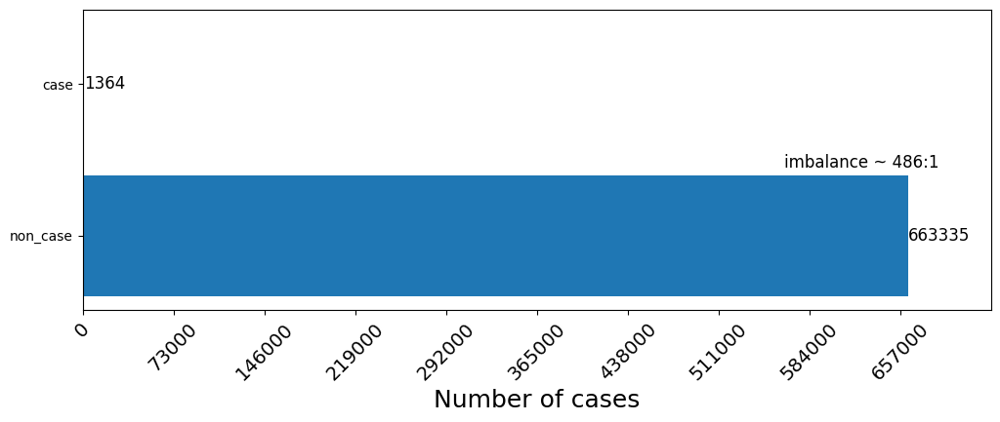

In [11]:
plot_imbalance(data_train, target_column='cases')

In [12]:
# plot_imbalance(data_test, target_column='cases')

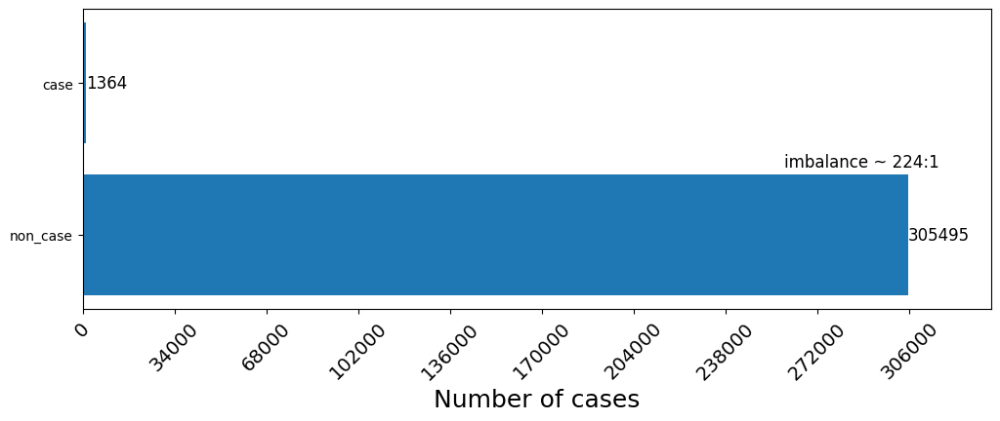

In [13]:
data_train = data_train.query('month >= 5 & month <= 10 & year <= 2021')
# dataset = dataset.query('month >= 5')
data_train.reset_index(drop=True, inplace=True)

plot_imbalance(data_train, target_column='cases')

In [14]:
data_test = data_test.query('month >= 5 & month <= 10')
data_test.reset_index(drop=True, inplace=True)

In [15]:
test_nuts3 = data_test.nuts3_id.unique()
test_years = data_test.year.unique()

In [16]:
# data_train = data_train.query('not (year in @test_years and nuts3_id in @test_nuts3)')
# # dataset = dataset.query('month >= 5')
# data_train.reset_index(drop=True, inplace=True)

# plot_imbalance(data_train, target_column='cases')

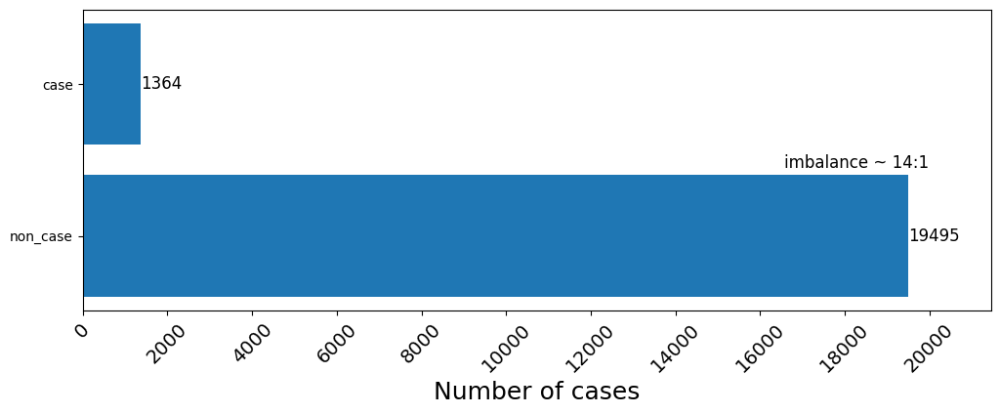

In [17]:
rows_to_remove = data_train.query('cases == 0').sample(n=286000, random_state=0).index
# rows_to_remove = data_train.query('cases == 0').sample(n=150000, random_state=0).index

data_train.drop(rows_to_remove, inplace=True)
data_train.reset_index(drop=True, inplace=True)

plot_imbalance(data_train, target_column='cases')

In [18]:
data_train.shape

(20720, 94)

In [19]:
data_train.cases.sum()

1364

In [20]:
dsc = dataframe_describe(data_train, target_column = 'cases')
dsc.head(15)

,year,non-case,case,total,0/1 ratio
0,2010,1651,262,1913,6.30%
1,2011,1605,100,1705,16.05%
2,2012,1615,157,1772,10.29%
3,2013,1658,85,1743,19.51%
4,2014,1556,15,1571,103.73%
5,2015,1647,0,1647,inf%
6,2016,1659,0,1659,inf%
7,2017,1588,42,1630,37.81%
8,2018,1570,296,1866,5.30%
9,2019,1651,218,1869,7.57%


In [21]:
features_to_remove = ['x', 'y', 'year', 'month']
features_to_remove += ['lc_prop1', 'lc_prop2', 'lc_prop3', 'lc_type2', 'lc_type3', 'lc_type4', 'lc_type5',]
feature_names = data_train.select_dtypes(exclude=['object']).drop(columns = features_to_remove).columns
print(feature_names.to_list())

print(f"Total Features Used: {len(feature_names)}")

['ndvi', 'ndmi', 'ndwi', 'ndbi', 'ndvi_mean', 'ndmi_mean', 'ndwi_mean', 'ndbi_mean', 'ndvi_std', 'ndmi_std', 'ndwi_std', 'ndbi_std', 'lst_day_mean', 'lst_jan_day_mean', 'lst_feb_day_mean', 'lst_mar_day_mean', 'lst_apr_day_mean', 'lst_night_mean', 'lst_jan_night_mean', 'lst_feb_night_mean', 'lst_mar_night_mean', 'lst_apr_night_mean', 'lst_mean', 'lst_jan_mean', 'lst_feb_mean', 'lst_mar_mean', 'lst_apr_mean', 'monthly_lst_min', 'monthly_lst_max', 'rainfall_mean', 'acc_rainfall_1week', 'acc_rainfall_2week', 'acc_rainfall_month', 'acc_rainfall_jan', 'bio1', 'bio2', 'bio3', 'bio4', 'bio5', 'bio6', 'bio7', 'bio8', 'bio9', 'bio10', 'bio11', 'bio12', 'bio13', 'bio14', 'bio15', 'bio16', 'bio17', 'bio18', 'bio19', 'lc_type1', 'distance_to_coast', 'distance_to_river', 'slope_mean_1km', 'aspect_mean_200m', 'elevation_mean_1km', 'hillshade_mean_1km', 'fs_area_1km', 'flow_accu_200m', 'males_lt15', 'males_15t64', 'males_gt65', 'males_total', 'females_lt15', 'females_15t64', 'females_gt65', 'females_t

In [22]:
data_train = convert_multiple_cases(data_train, target_col='cases')
data_train.reset_index(inplace = True, drop = True)

sum_negatives = data_train['cases'].value_counts().get(0)
sum_positives = data_train['cases'].value_counts().get(1)

params = {
    "seed": 0,
    "objective": "binary:logistic",
    "device": "gpu", 
    "eval_metric": "logloss",
    "learning_rate": 0.3,          #default 0.3, range[0,1], large values lead to overfitting
    "min_split_loss": 0.3,          #default 0, range[0,inf], large values lead to underfitting
    "max_depth": 3,                 #default 6, range[0,inf], large values lead to overfitting
    "reg_alpha": 0.5,               #default 0, range[0,inf], large values lead to underfitting
    "reg_lambda": 1.5,              #default 1, range[0,inf], large values lead to underfitting
    "min_child_weight": 1.5,        #default 1, range[0,inf], large values lead to underfitting
    "scale_pos_weight": sum_negatives/sum_positives, 
}


X_train = data_train.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cases'])
y_train = data_train['cases']

print(f"Training set 0/1 Ratio: {(sum_negatives / sum_positives):.2f}")
print(f"Weight: {(sum_negatives/sum_positives):.2f}")
    
scaler = MinMaxScaler(feature_range = (-1, 1))
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
            
imputer = KNNImputer()
imputer.fit(X_train)
X_train_imputed = imputer.transform(X_train_scaled)
    
model = xgb.XGBClassifier(**params)   
trained_model = model.fit(X_train_imputed, y_train)

Training set 0/1 Ratio: 14.29
Weight: 14.29


In [23]:
data_test_may = data_test.query(f'month == 5').reset_index(drop=True)
data_test_jun = data_test.query(f'month == 6').reset_index(drop=True)
data_test_jul = data_test.query(f'month == 7').reset_index(drop=True)
data_test_aug = data_test.query(f'month == 8').reset_index(drop=True)
data_test_sep = data_test.query(f'month == 9').reset_index(drop=True)
data_test_oct = data_test.query(f'month == 10').reset_index(drop=True)

In [24]:
data_test

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,ndvi,ndmi,ndwi,ndbi,ndvi_mean,ndmi_mean,ndwi_mean,ndbi_mean,ndvi_std,ndmi_std,ndwi_std,ndbi_std,lst_day_mean,lst_jan_day_mean,lst_feb_day_mean,lst_mar_day_mean,lst_apr_day_mean,lst_night_mean,lst_jan_night_mean,lst_feb_night_mean,lst_mar_night_mean,lst_apr_night_mean,lst_mean,lst_jan_mean,lst_feb_mean,lst_mar_mean,lst_apr_mean,monthly_lst_min,monthly_lst_max,rainfall_mean,acc_rainfall_1week,acc_rainfall_2week,acc_rainfall_month,acc_rainfall_jan,bio1,bio2,bio3,bio4,bio5,bio6,bio7,bio8,bio9,bio10,bio11,bio12,bio13,bio14,bio15,bio16,bio17,bio18,bio19,lc_prop1,lc_prop2,lc_prop3,lc_type1,lc_type2,lc_type3,lc_type4,lc_type5,distance_to_coast,distance_to_river,slope_mean_1km,aspect_mean_200m,elevation_mean_1km,hillshade_mean_1km,fs_area_1km,flow_accu_200m,males_lt15,males_15t64,males_gt65,males_total,females_lt15,females_15t64,females_gt65,females_total,mio_eur,l_total,unl_total,mount_type,urbn_type,coast_type,month_sin,month_cos
0,0,EL30,EL307,κυθηρων,2024,5,22.92536,36.22923,0.456022,0.120288,-0.422576,-0.120288,0.428696,0.110163,-0.399211,-0.110163,0.042036,0.025916,0.026007,0.025916,21.481333,12.490000,13.181034,16.062903,21.481333,12.883333,9.364194,9.434138,9.587419,12.883333,17.182333,10.927097,11.307586,12.825161,17.182333,6.83,28.13,1.022162,0.302366,28.825284,30.664851,426.513412,18.333333,17.500000,43.750000,740.188346,41.0,1.0,40.0,11.333333,24.666667,28.000000,9.500000,833.0,202.0,1.0,109.989323,465.0,9.0,9.0,310.0,22,20,20,9,9,4,2,2,1554.806149,2545.316809,27,217.502550,313.370524,207.335062,0.0,1.499166,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1,0.500000,-0.866025
1,1,EL30,EL307,κυθηρων,2024,5,22.92536,36.31906,0.521018,0.139113,-0.432771,-0.139113,0.468234,0.148362,-0.403926,-0.148362,0.025451,0.012167,0.010231,0.012167,22.110667,13.588065,15.263793,17.157097,22.110667,12.966000,9.187419,9.833448,9.995161,12.966000,17.538333,11.387742,12.548621,13.576129,17.538333,7.11,27.57,0.788809,0.743949,22.269518,23.664268,491.354264,18.375000,17.416667,39.583333,755.622862,41.0,-3.0,44.0,13.000000,25.333333,28.166667,9.666667,754.0,177.0,0.0,110.115026,431.0,3.0,5.0,234.0,21,20,20,8,8,4,2,2,1765.480985,6926.111027,10,197.077012,274.126271,180.773995,0.0,5.117582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1,0.500000,-0.866025
2,2,EL30,EL307,κυθηρων,2024,5,22.92536,36.33703,0.512848,0.188638,-0.427164,-0.188638,0.502831,0.185711,-0.424863,-0.185711,0.036536,0.044237,0.013032,0.044237,21.338000,13.320323,13.739655,16.131290,21.338000,13.859333,9.788710,10.166552,10.472581,13.859333,17.598667,11.554516,11.953103,13.301935,17.598667,7.23,26.39,0.788809,0.743949,22.269518,23.664268,491.354264,18.291667,14.916667,37.291667,713.652046,40.0,0.0,40.0,11.833333,24.333333,27.666667,10.333333,754.0,177.0,0.0,110.115026,431.0,3.0,5.0,304.0,11,10,10,1,1,7,1,1,1903.382813,7495.847864,7,235.289966,337.325945,186.904082,0.0,1.487290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1,0.500000,-0.866025
3,3,EL30,EL307,κυθηρων,2024,5,22.94752,36.19329,0.598951,0.255672,-0.494354,-0.255672,0.558756,0.219490,-0.473545,-0.219490,0.030131,0.032644,0.019021,0.032644,22.332667,11.575806,13.784483,15.124194,22.332667,12.624000,9.050645,8.898966,8.758387,12.624000,17.478333,10.313226,11.341724,11.941290,17.478333,7.19,28.91,0.646547,1.046640,16.653719,19.396413,378.710040,18.416667,17.333333,43.333333,711.219610,41.0,1.0,40.0,12.333333,24.666667,27.833333,10.000000,776.0,200.0,1.0,111.830868,467.0,7.0,7.0,316.0,22,20,20,9,9,4,2,2,2106.538145,3337.921859,15,286.834685,337.529195,188.715719,0.0,1.065844,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,1,0.500000,-0.866025
4,4,EL30,EL307,κυθηρων,2024,5,22.94752,36.21126,0.547390,0.199938,-0.486196,-0.199938,0.520833,0.188483,-0.467653,-0.188483,0.040398,0.029391,0.026076,0.029391,22.103333,11.722903,13.921724,16.824194,22.103333,12.496000,8.605484,8.465862,8.579677,12.496000,17.299667,10.164194,11.193793,12.701935,17.299667,6.77,28.93,1.022162,0.302

### Results 2024 ###

In [25]:
X_test = data_test_may.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cell_number'])

X_test_scaled = scaler.transform(X_test)
X_test_imputed = imputer.transform(X_test_scaled)
    
y_test_prob = trained_model.predict_proba(X_test_imputed)[:, 1].tolist()

results_may = pd.concat([data_test_may.iloc[:, :8], pd.Series(y_test_prob, name='score')], axis=1)

In [26]:
X_test = data_test_jun.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cell_number'])

X_test_scaled = scaler.transform(X_test)
X_test_imputed = imputer.transform(X_test_scaled)
    
y_test_prob = trained_model.predict_proba(X_test_imputed)[:, 1].tolist()

results_jun = pd.concat([data_test_jun.iloc[:, :8], pd.Series(y_test_prob, name='score')], axis=1)

In [27]:
X_test = data_test_jul.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cell_number'])

X_test_scaled = scaler.transform(X_test)
X_test_imputed = imputer.transform(X_test_scaled)
    
y_test_prob = trained_model.predict_proba(X_test_imputed)[:, 1].tolist()

results_jul = pd.concat([data_test_jul.iloc[:, :8], pd.Series(y_test_prob, name='score')], axis=1)

In [28]:
X_test = data_test_aug.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cell_number'])

X_test_scaled = scaler.transform(X_test)
X_test_imputed = imputer.transform(X_test_scaled)
    
y_test_prob = trained_model.predict_proba(X_test_imputed)[:, 1].tolist()

results_aug = pd.concat([data_test_aug.iloc[:, :8], pd.Series(y_test_prob, name='score')], axis=1)

In [29]:
# X_test = data_test_sep.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cell_number'])

# X_test_scaled = scaler.transform(X_test)
# X_test_imputed = imputer.transform(X_test_scaled)
    
# y_test_prob = trained_model.predict_proba(X_test_imputed)[:, 1].tolist()

# results_sep = pd.concat([data_test_sep.iloc[:, :8], pd.Series(y_test_prob, name='score')], axis=1)

In [30]:
# X_test = data_test_oct.select_dtypes(exclude=['object']).drop(columns = features_to_remove + ['cell_number'])

# X_test_scaled = scaler.transform(X_test)
# X_test_imputed = imputer.transform(X_test_scaled)
    
# y_test_prob = trained_model.predict_proba(X_test_imputed)[:, 1].tolist()

# results_oct = pd.concat([data_test_oct.iloc[:, :8], pd.Series(y_test_prob, name='score')], axis=1)

In [31]:
results_may.sort_values(by='score', ascending=False).head(5)

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,score
330,330,EL30,EL304,καλλιθεας,2024,5,23.70093,37.95403,0.157228
309,309,EL30,EL304,μοσχατου ταυρου,2024,5,23.67877,37.95403,0.101380
329,329,EL30,EL304,παλαιου φαληρου,2024,5,23.70093,37.93606,0.056102
352,352,EL30,EL303,αθηναιων,2024,5,23.72309,37.95403,0.041978
374,374,EL30,EL304,ελληνικου αργυρουπολης,2024,5,23.74525,37.90013,0.033050


In [32]:
results_jun.sort_values(by='score', ascending=False).head(5)

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,score
330,330,EL30,EL304,καλλιθεας,2024,6,23.70093,37.95403,0.136221
329,329,EL30,EL304,παλαιου φαληρου,2024,6,23.70093,37.93606,0.128715
260,260,EL30,EL306,ασπροπυργου,2024,6,23.56797,38.07980,0.122796
656,656,EL30,EL305,σαρωνικου,2024,6,23.96684,37.82826,0.109168
405,405,EL30,EL303,αθηναιων,2024,6,23.76741,37.98996,0.101703


In [33]:
results_jul.sort_values(by='score', ascending=False).head(5)

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,score
329,329,EL30,EL304,παλαιου φαληρου,2024,7,23.70093,37.93606,0.932730
145,145,EL30,EL306,μεγαρεων,2024,7,23.34639,37.98996,0.928682
375,375,EL30,EL304,ελληνικου αργυρουπολης,2024,7,23.74525,37.91810,0.886894
309,309,EL30,EL304,μοσχατου ταυρου,2024,7,23.67877,37.95403,0.875817
408,408,EL30,EL301,ηρακλειου,2024,7,23.76741,38.04386,0.874511


In [34]:
results_aug.sort_values(by='score', ascending=False).head(5)

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,score
145,145,EL30,EL306,μεγαρεων,2024,8,23.34639,37.98996,0.856722
334,334,EL30,EL302,ιλιου,2024,8,23.70093,38.02590,0.853132
329,329,EL30,EL304,παλαιου φαληρου,2024,8,23.70093,37.93606,0.836394
375,375,EL30,EL304,ελληνικου αργυρουπολης,2024,8,23.74525,37.91810,0.832675
309,309,EL30,EL304,μοσχατου ταυρου,2024,8,23.67877,37.95403,0.823788


In [35]:
# results_sep.sort_values(by='score', ascending=False).head(5)

In [36]:
# results_oct.sort_values(by='score', ascending=False).head(5)

In [37]:
folder_path = "E:/Drive/NOA/MBD-Prediction/Shapefiles/Greece Shapefiles"
region_grid = gpd.read_file(f'{base_folder}/{NUTS2}/{NUTS0}_{NUTS2}_GRID.shp',  encoding='utf-8')
greece_nuts2_gdf = gpd.read_file(r"E:\Drive\NOA\MBD-Prediction\Europe Shapefiles\Greece\data\EL_NUTS2.shp",  encoding='utf8')
greece_lau1 = gpd.read_file(f"{folder_path}/el_lau1.shp",  encoding='utf8')
greece_lakes = gpd.read_file(f"{folder_path}/limnes/lakes.shp",  encoding='utf8')
wnv_groud_truth = pd.read_csv(f"../../../data/{NUTS0}_WNV_cases_GRID_2010-2021_processed.csv", encoding='utf8')
grid_index = gpd.read_file(f"../../../data/grid_index/grid_index.shp", encoding = 'utf-8')

In [38]:
region_grid = region_grid.to_crs(epsg=4326)
region_grid.drop(columns=['NUTS2_ID', 'x', 'y'], inplace=True)
region_grid = region_grid.set_axis(['cell_number', 'geometry'], axis=1)
print(f'greece_index CRS: {region_grid.crs}')

greece_nuts2_gdf = greece_nuts2_gdf.to_crs(epsg=4326)
greece_nuts2_gdf.drop(columns=['CNTR_CODE', 'NAME_LATN', 'CNTR_NAME'], inplace=True)
greece_nuts2_gdf = greece_nuts2_gdf[greece_nuts2_gdf['NUTS_ID'] == NUTS2_ID]
greece_nuts2_gdf.reset_index(drop=True, inplace=True)
print(f'greece_nuts2 CRS: {greece_nuts2_gdf.crs}')

greece_lau1 = greece_lau1.to_crs(epsg=4326)
greece_lau1.drop(columns=['KWD_YPES'], inplace=True)
greece_lau1['buffered_geometry'] = greece_lau1['geometry'].buffer(-0.005)  # Adjust the buffer distance as needed
greece_lau1.set_geometry('buffered_geometry', inplace=True)
greece_lau1_outer = gpd.sjoin(greece_lau1, greece_nuts2_gdf, op='overlaps')
greece_lau1_inner = gpd.sjoin(greece_lau1, greece_nuts2_gdf, op='within')
greece_lau1 = pd.concat([greece_lau1_outer, greece_lau1_inner], axis=0)
greece_lau1.drop_duplicates(inplace=True)
greece_lau1.set_geometry('geometry', inplace=True)
greece_lau1.drop(columns=['index_right','NUTS_ID','NUTS_NAME', 'buffered_geometry'], inplace=True)
greece_lau1.reset_index(drop = True, inplace = True)
print(f'greece_lau1 CRS: {greece_lau1.crs}')

greece_lakes = greece_lakes.to_crs(epsg=4326)
greece_lakes.drop(columns=['objectid','EU_CD','MS_CD','NAME','ALTNAME2','ALTNAME3','BASIN_CD','CHARACTER_'], inplace=True)
greece_lakes = greece_lakes.set_axis(['name', 'area', 'length', 'geometry'], axis=1)
greece_lakes_outer = gpd.sjoin(greece_lakes, greece_nuts2_gdf, op='overlaps')
greece_lakes_inner = gpd.sjoin(greece_lakes, greece_nuts2_gdf, op='within')
greece_lakes = pd.concat([greece_lakes_outer, greece_lakes_inner], axis=0)
greece_lakes = gpd.overlay(greece_nuts2_gdf, greece_lakes, how='intersection')
greece_lakes.drop(columns=['NUTS_ID_1','NUTS_NAME_1','index_right','NUTS_ID_2','NUTS_NAME_2'], inplace=True)
greece_lakes['u_key'] = greece_lakes.index

greece_lakes.reset_index(drop=True, inplace=True)
print(f'greece_lakes CRS: {greece_lakes.crs}')

grouped_by_cell = wnv_groud_truth.drop(columns=['onset of symptoms', 'day', 'nuts3','lau1','lau2']).groupby(['cell_code','year','month', 'nuts2'], as_index = False)
grouped_by_cell_sum = grouped_by_cell.sum()
grouped_by_cell_sum = grouped_by_cell_sum.set_axis(['cell_number', 'year','month', 'nuts2', 'cases'], axis=1)
grouped_by_cell_sum.reset_index(drop = True, inplace=True)

grid_index = grid_index.to_crs(epsg=4326)
grid_index.drop(columns=['PageNumber'], inplace=True)
grid_index = grid_index.set_axis(['cell_number', 'geometry'], axis=1)
grid_index['centroid'] = grid_index['geometry'].centroid
print(f'grid_index CRS: {grid_index.crs}')

grid_index = grid_index.merge(grouped_by_cell_sum, on=['cell_number'])

greece_index CRS: EPSG:4326
greece_nuts2 CRS: EPSG:4326
greece_lau1 CRS: EPSG:4326
greece_lakes CRS: EPSG:4326
grid_index CRS: EPSG:4326


In [39]:
region_grid.head()

,cell_number,geometry
0,0,"POLYGON ((22.93644 36.22024, 22.91428 36.22024..."
1,1,"POLYGON ((22.93644 36.31008, 22.91428 36.31008..."
2,2,"POLYGON ((22.93644 36.32804, 22.91428 36.32804..."
3,3,"POLYGON ((22.95860 36.18431, 22.93644 36.18431..."
4,4,"POLYGON ((22.95860 36.20228, 22.93644 36.20228..."


In [40]:
greece_nuts2_gdf.head()

,NUTS_ID,NUTS_NAME,geometry
0,EL30,Aττική,"MULTIPOLYGON (((24.10518 38.18205, 24.10171 38..."


In [41]:
greece_lau1.head()

,NAME,geometry
0,Ελευσίνας,"POLYGON ((23.50387 38.13648, 23.50497 38.13616..."
1,Ιλίου,"POLYGON ((23.68392 38.06429, 23.68763 38.06131..."
2,Ύδρας,"MULTIPOLYGON (((23.40645 37.29497, 23.40642 37..."
3,Αίγινας,"MULTIPOLYGON (((23.31935 37.80028, 23.31914 37..."
4,Αγίας Βαρβάρας,"POLYGON ((23.64394 37.99855, 23.64396 37.99856..."


In [42]:
greece_lakes.head()

,name,area,length,geometry,u_key
0,MARATHONA RESERVOIR,2982333.8,11410.567,"POLYGON ((23.87974 38.17811, 23.88232 38.17924...",0


In [43]:
results_may = pd.merge(results_may, region_grid, on='cell_number', how='left')
results_may = gpd.GeoDataFrame(results_may, geometry='geometry')
results_may['x'] = results_may['x'].round(4)
results_may['y'] = results_may['y'].round(4)
results_may.rename(columns={'score': 'risk_score'}, inplace=True)
results_may['risk_score'] = results_may['risk_score'].round(6)

results_jun = pd.merge(results_jun, region_grid, on='cell_number', how='left')
results_jun = gpd.GeoDataFrame(results_jun, geometry='geometry')
results_jun['x'] = results_jun['x'].round(4)
results_jun['y'] = results_jun['y'].round(4)
results_jun.rename(columns={'score': 'risk_score'}, inplace=True)
results_jun['risk_score'] = results_jun['risk_score'].round(6)

results_jul = pd.merge(results_jul, region_grid, on='cell_number', how='left')
results_jul = gpd.GeoDataFrame(results_jul, geometry='geometry')
results_jul['x'] = results_jul['x'].round(4)
results_jul['y'] = results_jul['y'].round(4)
results_jul.rename(columns={'score': 'risk_score'}, inplace=True)
results_jul['risk_score'] = results_jul['risk_score'].round(6)

results_aug = pd.merge(results_aug, region_grid, on='cell_number', how='left')
results_aug = gpd.GeoDataFrame(results_aug, geometry='geometry')
results_aug['x'] = results_aug['x'].round(4)
results_aug['y'] = results_aug['y'].round(4)
results_aug.rename(columns={'score': 'risk_score'}, inplace=True)
results_aug['risk_score'] = results_aug['risk_score'].round(6)

# results_sep = pd.merge(results_sep, region_grid, on='cell_number', how='left')
# results_sep = gpd.GeoDataFrame(results_sep, geometry='geometry')
# results_sep['x'] = results_sep['x'].round(4)
# results_sep['y'] = results_sep['y'].round(4)
# results_sep.rename(columns={'score': 'risk_score'}, inplace=True)
# results_sep['risk_score'] = results_sep['risk_score'].round(6)

# results_oct = pd.merge(results_oct, region_grid, on='cell_number', how='left')
# results_oct = gpd.GeoDataFrame(results_oct, geometry='geometry')
# results_oct['x'] = results_oct['x'].round(4)
# results_oct['y'] = results_oct['y'].round(4)
# results_oct.rename(columns={'score': 'risk_score'}, inplace=True)
# results_oct['risk_score'] = results_oct['risk_score'].round(6)

In [44]:
type(results_may)

geopandas.geodataframe.GeoDataFrame

In [45]:
# results_may.to_file(f'../../../data/{NUTS2}/results/{NUTS0}_{NUTS2}_Predictions_May_{TEST_YEAR}.shp', encoding = 'utf-8', index = False)
# results_jun.to_file(f'../../../data/{NUTS2}/results/{NUTS0}_{NUTS2}_Predictions_June_{TEST_YEAR}.shp', encoding = 'utf-8', index = False)
# results_jul.to_file(f'../../../data/{NUTS2}/results/{NUTS0}_{NUTS2}_Predictions_July_{TEST_YEAR}.shp', encoding = 'utf-8', index = False)
# results_aug.to_file(f'../../../data/{NUTS2}/results/{NUTS0}_{NUTS2}_Predictions_August_{TEST_YEAR}.shp', encoding = 'utf-8', index = False)
# results_sep.to_file(f'../../../data/{NUTS2}/results/{NUTS0}_{NUTS2}_Predictions_September_{TEST_YEAR}.shp', encoding = 'utf-8', index = False)
# results_oct.to_file(f'../../../data/{NUTS2}/results/{NUTS0}_{NUTS2}_Predictions_October_{TEST_YEAR}.shp', encoding = 'utf-8', index = False)

In [46]:
float_column = 'risk_score'
geometry_column = 'geometry'
cmap = plt.cm.coolwarm
figure_size = (15,9)
lake_face_color = '#c4dff4'
lake_edge_color = '#0978ab'
lake_line_w = 0.4
nuts_face_color = 'none'
boundry_color = 'black'
nuts_line_w = 1.5
lau_line_w = 0.8
lau_opacity = 0.35
title_size = 22
point_color = '#FF0000'
month_dict = {5:'May', 6:'June', 7:'July', 8:'August', 9:'September', 10:'October'}

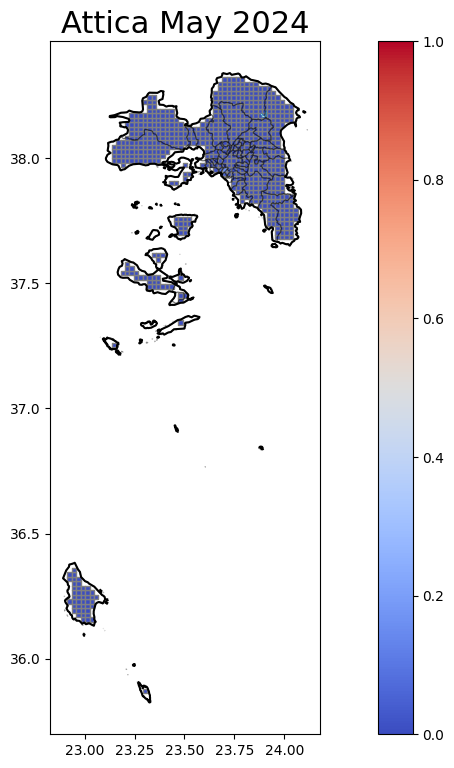

In [47]:
fig, ax = plt.subplots(figsize=figure_size)
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 5)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

# Plot the geometry column with the colors based on the float column
results_may.plot(ax=ax, column=float_column, cmap=cmap, edgecolor='grey', legend=True, vmin = 0, vmax = 1)
greece_lakes.plot(ax=ax, color=lake_face_color, edgecolor=lake_edge_color, linewidth = lake_line_w)
greece_nuts2_gdf.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = nuts_line_w)
greece_lau1.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = lau_line_w, alpha = lau_opacity)
try:
    wnv_cases_grid.plot(ax=ax, color = point_color, markersize = 10)
except ValueError:
    pass

plt.title(f'{NUTS2} {month_dict.get(results_may.month.iloc[0])} {TEST_YEAR}', size = title_size)
plt.show()

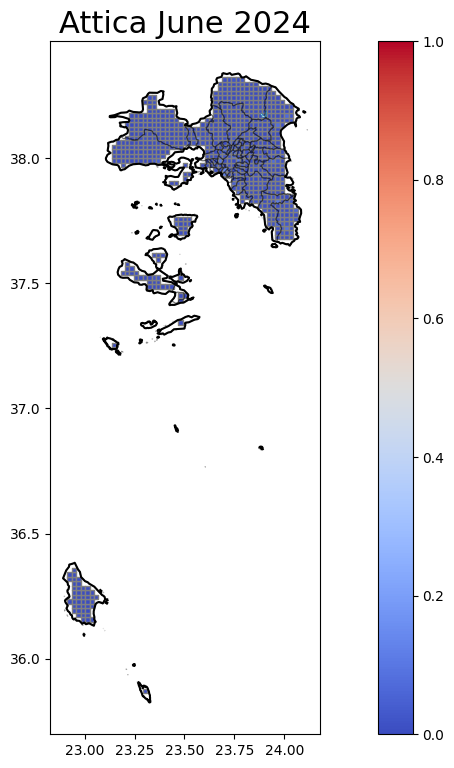

In [48]:
fig, ax = plt.subplots(figsize=figure_size)
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 6)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

# Plot the geometry column with the colors based on the float column
results_jun.plot(ax=ax, column=float_column, cmap=cmap, edgecolor='grey', legend=True, vmin = 0, vmax = 1)
greece_lakes.plot(ax=ax, color=lake_face_color, edgecolor=lake_edge_color, linewidth = lake_line_w)
greece_nuts2_gdf.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = nuts_line_w)
greece_lau1.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = lau_line_w, alpha = lau_opacity)
try:
    wnv_cases_grid.plot(ax=ax, color = point_color, markersize = 10)
except ValueError:
    pass

plt.title(f'{NUTS2} {month_dict.get(results_jun.month.iloc[0])} {TEST_YEAR}', size = title_size)
plt.show()

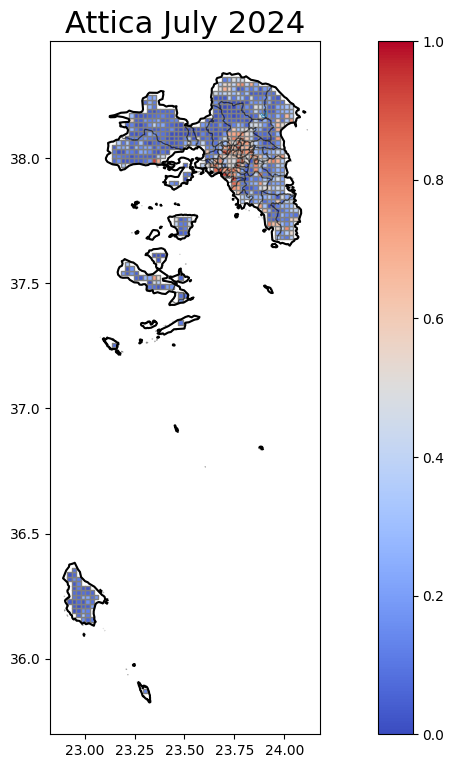

In [49]:
fig, ax = plt.subplots(figsize=figure_size)
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 7)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

# Plot the geometry column with the colors based on the float column
results_jul.plot(ax=ax, column=float_column, cmap=cmap, edgecolor='grey', legend=True, vmin = 0, vmax = 1)
greece_lakes.plot(ax=ax, color=lake_face_color, edgecolor=lake_edge_color, linewidth = lake_line_w)
greece_nuts2_gdf.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = nuts_line_w)
greece_lau1.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = lau_line_w, alpha = lau_opacity)
try:
    wnv_cases_grid.plot(ax=ax, color = point_color, markersize = 10)
except ValueError:
    pass

plt.title(f'{NUTS2} {month_dict.get(results_jul.month.iloc[0])} {TEST_YEAR}', size = title_size)
plt.show()

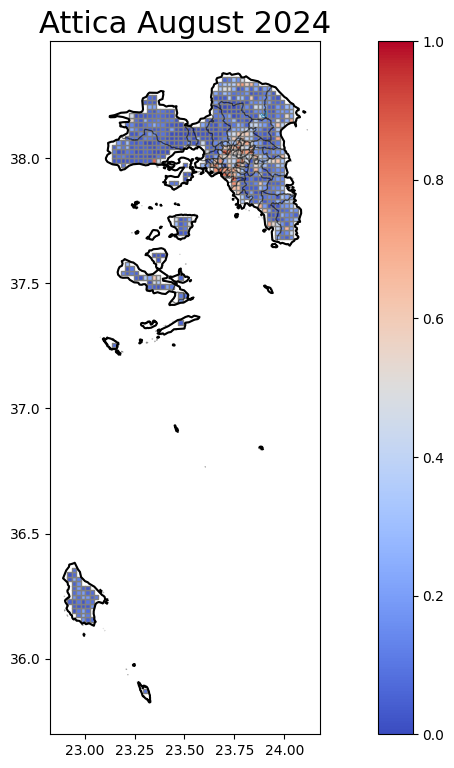

In [50]:
fig, ax = plt.subplots(figsize=figure_size)
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 8)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

# Plot the geometry column with the colors based on the float column
results_aug.plot(ax=ax, column=float_column, cmap=cmap, edgecolor='grey', legend=True, vmin = 0, vmax = 1)
greece_lakes.plot(ax=ax, color=lake_face_color, edgecolor=lake_edge_color, linewidth = lake_line_w)
greece_nuts2_gdf.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = nuts_line_w)
greece_lau1.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = lau_line_w, alpha = lau_opacity)
try:
    wnv_cases_grid.plot(ax=ax, color = point_color, markersize = 10)
except ValueError:
    pass

plt.title(f'{NUTS2} {month_dict.get(results_aug.month.iloc[0])} {TEST_YEAR}', size = title_size)
plt.show()

In [51]:
# fig, ax = plt.subplots(figsize=figure_size)
# wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 9)]
# wnv_cases_grid.set_geometry('centroid', inplace = True)

# # Plot the geometry column with the colors based on the float column
# results_sep.plot(ax=ax, column=float_column, cmap=cmap, edgecolor='grey', legend=True, vmin = 0, vmax = 1)
# greece_lakes.plot(ax=ax, color=lake_face_color, edgecolor=lake_edge_color, linewidth = lake_line_w)
# greece_nuts2_gdf.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = nuts_line_w)
# greece_lau1.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = lau_line_w, alpha = lau_opacity)
# try:
#     wnv_cases_grid.plot(ax=ax, color = point_color, markersize = 10)
# except ValueError:
#     pass

# plt.title(f'{NUTS2} {month_dict.get(results_sep.month.iloc[0])} {TEST_YEAR}', size = title_size)
# plt.show()

In [52]:
# fig, ax = plt.subplots(figsize=figure_size)
# wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 10)]
# wnv_cases_grid.set_geometry('centroid', inplace = True)

# # Plot the geometry column with the colors based on the float column
# results_oct.plot(ax=ax, column=float_column, cmap=cmap, edgecolor='grey', legend=True, vmin = 0, vmax = 1)
# greece_lakes.plot(ax=ax, color=lake_face_color, edgecolor=lake_edge_color, linewidth = lake_line_w)
# greece_nuts2_gdf.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = nuts_line_w)
# greece_lau1.plot(ax=ax, color=nuts_face_color, edgecolor=boundry_color, linewidth = lau_line_w, alpha = lau_opacity)
# try:
#     wnv_cases_grid.plot(ax=ax, color = point_color, markersize = 10)
# except ValueError:
#     pass

# plt.title(f'{NUTS2} {month_dict.get(results_oct.month.iloc[0])} {TEST_YEAR}', size = title_size)
# plt.show()

In [53]:
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 8)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

fig = interactive_colored_mapbox(results_may, greece_lakes, greece_nuts2_gdf, greece_lau1, wnv_cases_grid, 
                                 index_col='cell_number', color_col='risk_score', hover_name='lau1', 
                                 hover_data={'risk_score':True, 'x': True, 'y': True, 'nuts3_id': True, 'cell_number': False}, 
                                 center={'lat': greece_nuts2_gdf.geometry.centroid.y.iloc[0], 
                                         'lon': greece_nuts2_gdf.geometry.centroid.x.iloc[0]},
                                 zoom=7.5, cmap=matplotlib_to_plotly(cmap), opacity=0.75, 
                                 index_col_f2='u_key', hover_name_f2='name', color_f2='#aad3df', line_width_f4=0.8,
                                 hover_data_f2={'u_key': False, 'area':True, 'length':True}, fig_height=800, size_f5=6.5)

fig.show()
# fig.write_html(f"E:/Drive/NOA/Presentations/Internal Presentations/2x2_GRID_{NUTS2_ID}_August_2018.html")
# fig_json = fig.to_json()

# # Write the JSON string to a JavaScript file
# with open("choropleth_map.js", "w") as js_file:
#     js_file.write("var fig = ")
#     js_file.write(fig_json)
#     js_file.write(";")

In [54]:
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 8)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

fig = interactive_colored_mapbox(results_jun, greece_lakes, greece_nuts2_gdf, greece_lau1, wnv_cases_grid, 
                                 index_col='cell_number', color_col='risk_score', hover_name='lau1', 
                                 hover_data={'risk_score':True, 'x': True, 'y': True, 'nuts3_id': True, 'cell_number': False}, 
                                 center={'lat': greece_nuts2_gdf.geometry.centroid.y.iloc[0], 
                                         'lon': greece_nuts2_gdf.geometry.centroid.x.iloc[0]},
                                 zoom=7.5, cmap=matplotlib_to_plotly(cmap), opacity=0.75, 
                                 index_col_f2='u_key', hover_name_f2='name', color_f2='#aad3df', line_width_f4=0.8,
                                 hover_data_f2={'u_key': False, 'area':True, 'length':True}, fig_height=800, size_f5=6.5)

fig.show()
# fig.write_html(f"E:/Drive/NOA/Presentations/Internal Presentations/2x2_GRID_{NUTS2_ID}_August_2018.html")
# fig_json = fig.to_json()

# # Write the JSON string to a JavaScript file
# with open("choropleth_map.js", "w") as js_file:
#     js_file.write("var fig = ")
#     js_file.write(fig_json)
#     js_file.write(";")

In [55]:
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 8)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

fig = interactive_colored_mapbox(results_jul, greece_lakes, greece_nuts2_gdf, greece_lau1, wnv_cases_grid, 
                                 index_col='cell_number', color_col='risk_score', hover_name='lau1', 
                                 hover_data={'risk_score':True, 'x': True, 'y': True, 'nuts3_id': True, 'cell_number': False}, 
                                 center={'lat': greece_nuts2_gdf.geometry.centroid.y.iloc[0], 
                                         'lon': greece_nuts2_gdf.geometry.centroid.x.iloc[0]},
                                 zoom=7.5, cmap=matplotlib_to_plotly(cmap), opacity=0.75, 
                                 index_col_f2='u_key', hover_name_f2='name', color_f2='#aad3df', line_width_f4=0.8,
                                 hover_data_f2={'u_key': False, 'area':True, 'length':True}, fig_height=850, fig_width = 600, size_f5=6.5)

fig.show()
# fig.write_html(f"E:/Drive/NOA/Presentations/Internal Presentations/2x2_GRID_{NUTS2_ID}_August_2018.html")
# fig_json = fig.to_json()

# # Write the JSON string to a JavaScript file
# with open("choropleth_map.js", "w") as js_file:
#     js_file.write("var fig = ")
#     js_file.write(fig_json)
#     js_file.write(";")

In [56]:
wnv_cases_grid = grid_index[(grid_index['nuts2'] == NUTS2_EL) & (grid_index['year'] == int(TEST_YEAR)) & (grid_index['month'] == 8)]
wnv_cases_grid.set_geometry('centroid', inplace = True)

fig = interactive_colored_mapbox(results_aug, greece_lakes, greece_nuts2_gdf, greece_lau1, wnv_cases_grid, 
                                 index_col='cell_number', color_col='risk_score', hover_name='lau1', 
                                 hover_data={'risk_score':True, 'x': True, 'y': True, 'nuts3_id': True, 'cell_number': False}, 
                                 center={'lat': greece_nuts2_gdf.geometry.centroid.y.iloc[0], 
                                         'lon': greece_nuts2_gdf.geometry.centroid.x.iloc[0]},
                                 zoom=7.5, cmap=matplotlib_to_plotly(cmap), opacity=0.75, 
                                 index_col_f2='u_key', hover_name_f2='name', color_f2='#aad3df', line_width_f4=0.8,
                                 hover_data_f2={'u_key': False, 'area':True, 'length':True}, fig_height=800, size_f5=6.5)

fig.show()
# fig.write_html(f"E:/Drive/NOA/Presentations/Internal Presentations/2x2_GRID_{NUTS2_ID}_August_2018.html")
# fig_json = fig.to_json()

# # Write the JSON string to a JavaScript file
# with open("choropleth_map.js", "w") as js_file:
#     js_file.write("var fig = ")
#     js_file.write(fig_json)
#     js_file.write(";")

In [57]:
results_may

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,risk_score,geometry
0,0,EL30,EL307,κυθηρων,2024,5,22.9254,36.2292,0.000134,"POLYGON ((22.93644 36.22024, 22.91428 36.22024..."
1,1,EL30,EL307,κυθηρων,2024,5,22.9254,36.3191,0.000085,"POLYGON ((22.93644 36.31008, 22.91428 36.31008..."
2,2,EL30,EL307,κυθηρων,2024,5,22.9254,36.3370,0.000080,"POLYGON ((22.93644 36.32804, 22.91428 36.32804..."
3,3,EL30,EL307,κυθηρων,2024,5,22.9475,36.1933,0.000023,"POLYGON ((22.95860 36.18431, 22.93644 36.18431..."
4,4,EL30,EL307,κυθηρων,2024,5,22.9475,36.2113,0.000193,"POLYGON ((22.95860 36.20228, 22.93644 36.20228..."
...,...,...,...,...,...,...,...,...,...,...
732,732,EL30,EL305,μαραθωνος,2024,5,24.0333,38.1876,0.000147,"POLYGON ((24.04439 38.17861, 24.02223 38.17861..."
733,733,EL30,EL305,μαραθωνος,2024,5,24.0333,38.2056,0.000079,"POLYGON ((24.04439 38.19658, 24.02223 38.19658..."
734,734,EL30,EL305,λαυρεωτικης,2024,5,24.0555,37.7564,0.001845,"POLYGON ((24.06655 37.74741, 24.04439 37.74741..."
735,735,EL30,EL305,λαυρεωτικης,2024,5,24.0555,37.7744,0.000371,"POLYGON ((24.06655 37.76538, 24.04439 37.76538..."


In [58]:
results_jun

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,risk_score,geometry
0,0,EL30,EL307,κυθηρων,2024,6,22.9254,36.2292,0.000082,"POLYGON ((22.93644 36.22024, 22.91428 36.22024..."
1,1,EL30,EL307,κυθηρων,2024,6,22.9254,36.3191,0.000053,"POLYGON ((22.93644 36.31008, 22.91428 36.31008..."
2,2,EL30,EL307,κυθηρων,2024,6,22.9254,36.3370,0.000078,"POLYGON ((22.93644 36.32804, 22.91428 36.32804..."
3,3,EL30,EL307,κυθηρων,2024,6,22.9475,36.1933,0.000042,"POLYGON ((22.95860 36.18431, 22.93644 36.18431..."
4,4,EL30,EL307,κυθηρων,2024,6,22.9475,36.2113,0.000132,"POLYGON ((22.95860 36.20228, 22.93644 36.20228..."
...,...,...,...,...,...,...,...,...,...,...
732,732,EL30,EL305,μαραθωνος,2024,6,24.0333,38.1876,0.002287,"POLYGON ((24.04439 38.17861, 24.02223 38.17861..."
733,733,EL30,EL305,μαραθωνος,2024,6,24.0333,38.2056,0.001209,"POLYGON ((24.04439 38.19658, 24.02223 38.19658..."
734,734,EL30,EL305,λαυρεωτικης,2024,6,24.0555,37.7564,0.013555,"POLYGON ((24.06655 37.74741, 24.04439 37.74741..."
735,735,EL30,EL305,λαυρεωτικης,2024,6,24.0555,37.7744,0.001942,"POLYGON ((24.06655 37.76538, 24.04439 37.76538..."


In [59]:
results_jul

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,risk_score,geometry
0,0,EL30,EL307,κυθηρων,2024,7,22.9254,36.2292,0.031979,"POLYGON ((22.93644 36.22024, 22.91428 36.22024..."
1,1,EL30,EL307,κυθηρων,2024,7,22.9254,36.3191,0.046473,"POLYGON ((22.93644 36.31008, 22.91428 36.31008..."
2,2,EL30,EL307,κυθηρων,2024,7,22.9254,36.3370,0.015859,"POLYGON ((22.93644 36.32804, 22.91428 36.32804..."
3,3,EL30,EL307,κυθηρων,2024,7,22.9475,36.1933,0.004803,"POLYGON ((22.95860 36.18431, 22.93644 36.18431..."
4,4,EL30,EL307,κυθηρων,2024,7,22.9475,36.2113,0.040951,"POLYGON ((22.95860 36.20228, 22.93644 36.20228..."
...,...,...,...,...,...,...,...,...,...,...
732,732,EL30,EL305,μαραθωνος,2024,7,24.0333,38.1876,0.350533,"POLYGON ((24.04439 38.17861, 24.02223 38.17861..."
733,733,EL30,EL305,μαραθωνος,2024,7,24.0333,38.2056,0.432259,"POLYGON ((24.04439 38.19658, 24.02223 38.19658..."
734,734,EL30,EL305,λαυρεωτικης,2024,7,24.0555,37.7564,0.556181,"POLYGON ((24.06655 37.74741, 24.04439 37.74741..."
735,735,EL30,EL305,λαυρεωτικης,2024,7,24.0555,37.7744,0.088071,"POLYGON ((24.06655 37.76538, 24.04439 37.76538..."


In [60]:
results_aug

,cell_number,nuts2_id,nuts3_id,lau1,year,month,x,y,risk_score,geometry
0,0,EL30,EL307,κυθηρων,2024,8,22.9254,36.2292,0.045674,"POLYGON ((22.93644 36.22024, 22.91428 36.22024..."
1,1,EL30,EL307,κυθηρων,2024,8,22.9254,36.3191,0.030286,"POLYGON ((22.93644 36.31008, 22.91428 36.31008..."
2,2,EL30,EL307,κυθηρων,2024,8,22.9254,36.3370,0.018924,"POLYGON ((22.93644 36.32804, 22.91428 36.32804..."
3,3,EL30,EL307,κυθηρων,2024,8,22.9475,36.1933,0.009672,"POLYGON ((22.95860 36.18431, 22.93644 36.18431..."
4,4,EL30,EL307,κυθηρων,2024,8,22.9475,36.2113,0.044949,"POLYGON ((22.95860 36.20228, 22.93644 36.20228..."
...,...,...,...,...,...,...,...,...,...,...
732,732,EL30,EL305,μαραθωνος,2024,8,24.0333,38.1876,0.337977,"POLYGON ((24.04439 38.17861, 24.02223 38.17861..."
733,733,EL30,EL305,μαραθωνος,2024,8,24.0333,38.2056,0.318984,"POLYGON ((24.04439 38.19658, 24.02223 38.19658..."
734,734,EL30,EL305,λαυρεωτικης,2024,8,24.0555,37.7564,0.312987,"POLYGON ((24.06655 37.74741, 24.04439 37.74741..."
735,735,EL30,EL305,λαυρεωτικης,2024,8,24.0555,37.7744,0.054198,"POLYGON ((24.06655 37.76538, 24.04439 37.76538..."


In [61]:
results_jul.to_file(f'../../../data/{NUTS2}/predictions/GR_{NUTS2}_GRID_Predictions_July_2024.shp', encoding = 'utf-8')

DriverIOError: Failed to create file ../../../data/Attica/predictions\GR_Attica_GRID_Predictions_July_2024.shp: No such file or directory

In [ ]:
greece_nuts2_gdf.to_file(f'../../../data/{NUTS2}/predictions/GR_{NUTS2}_NUTS2.shp', encoding = 'utf-8')

In [ ]:
greece_lau1.to_file(f'../../../data/{NUTS2}/predictions/GR_{NUTS2}_LAU1.shp', encoding = 'utf-8')